# Deal with data

## Import

In [46]:
import pandas as pd
import seaborn as sns
import numpy as np 
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from datetime import datetime
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression  
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.cluster import KMeans
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.decomposition import PCA

## Load the data

In [4]:
data = pd.read_csv("./dataset/1. Engineering_graduate_salary.csv")

## Check the data

In [5]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2998 entries, 0 to 2997
Data columns (total 34 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     2998 non-null   int64  
 1   Gender                 2998 non-null   object 
 2   DOB                    2998 non-null   object 
 3   10percentage           2998 non-null   float64
 4   10board                2998 non-null   object 
 5   12graduation           2998 non-null   int64  
 6   12percentage           2998 non-null   float64
 7   12board                2998 non-null   object 
 8   CollegeID              2998 non-null   int64  
 9   CollegeTier            2998 non-null   int64  
 10  Degree                 2998 non-null   object 
 11  Specialization         2998 non-null   object 
 12  collegeGPA             2998 non-null   float64
 13  CollegeCityID          2998 non-null   int64  
 14  CollegeCityTier        2998 non-null   int64  
 15  Coll

In [6]:
data.head()

,ID,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,...,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary
0,604399,f,1990-10-22,87.80,cbse,2009,84.00,cbse,6920,1,...,-1,-1,-1,-1,-0.1590,0.3789,1.2396,0.14590,0.2889,445000
1,988334,m,1990-05-15,57.00,cbse,2010,64.50,cbse,6624,2,...,-1,-1,-1,-1,1.1336,0.0459,1.2396,0.52620,-0.2859,110000
2,301647,m,1989-08-21,77.33,"maharashtra state board,pune",2007,85.17,amravati divisional board,9084,2,...,-1,-1,260,-1,0.5100,-0.1232,1.5428,-0.29020,-0.2875,255000
3,582313,m,1991-05-04,84.30,cbse,2009,86.00,cbse,8195,1,...,-1,-1,-1,-1,-0.4463,0.2124,0.3174,0.27270,0.4805,420000
4,339001,f,1990-10-30,82.00,cbse,2008,75.00,cbse,4889,2,...,-1,-1,-1,-1,-1.4992,-0.7473,-1.0697,0.06223,0.1864,200000


## Deal with data

Replacing male with 0 and female with 1

In [7]:
data["Gender"] = data["Gender"].replace({'m': 0, 'f': 1})

C:\Users\10603\AppData\Local\Temp\ipykernel_19972\3516632490.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data["Gender"] = data["Gender"].replace({'m': 0, 'f': 1})


Convert BirthDate to datetime

In [8]:
data['DOB'] = pd.to_datetime(data['DOB'])

# Calculate age
current_year = datetime.now().year
data['Age'] = current_year - data['DOB'].dt.year

# Drop the original BirthDate column if not needed
data.drop(columns=['DOB'], inplace=True)

### Data Cleansing

Handling duplicate data

In [9]:
data.duplicated().any()

np.False_

Handling missing data

In [10]:
data.isnull().any()

ID                       False
Gender                   False
10percentage             False
10board                  False
12graduation             False
12percentage             False
12board                  False
CollegeID                False
CollegeTier              False
Degree                   False
Specialization           False
collegeGPA               False
CollegeCityID            False
CollegeCityTier          False
CollegeState             False
GraduationYear           False
English                  False
Logical                  False
Quant                    False
Domain                   False
ComputerProgramming      False
ElectronicsAndSemicon    False
ComputerScience          False
MechanicalEngg           False
ElectricalEngg           False
TelecomEngg              False
CivilEngg                False
conscientiousness        False
agreeableness            False
extraversion             False
nueroticism              False
openess_to_experience    False
Salary  

## EDA (Exploratory Data Analysis)

### Hist Plot

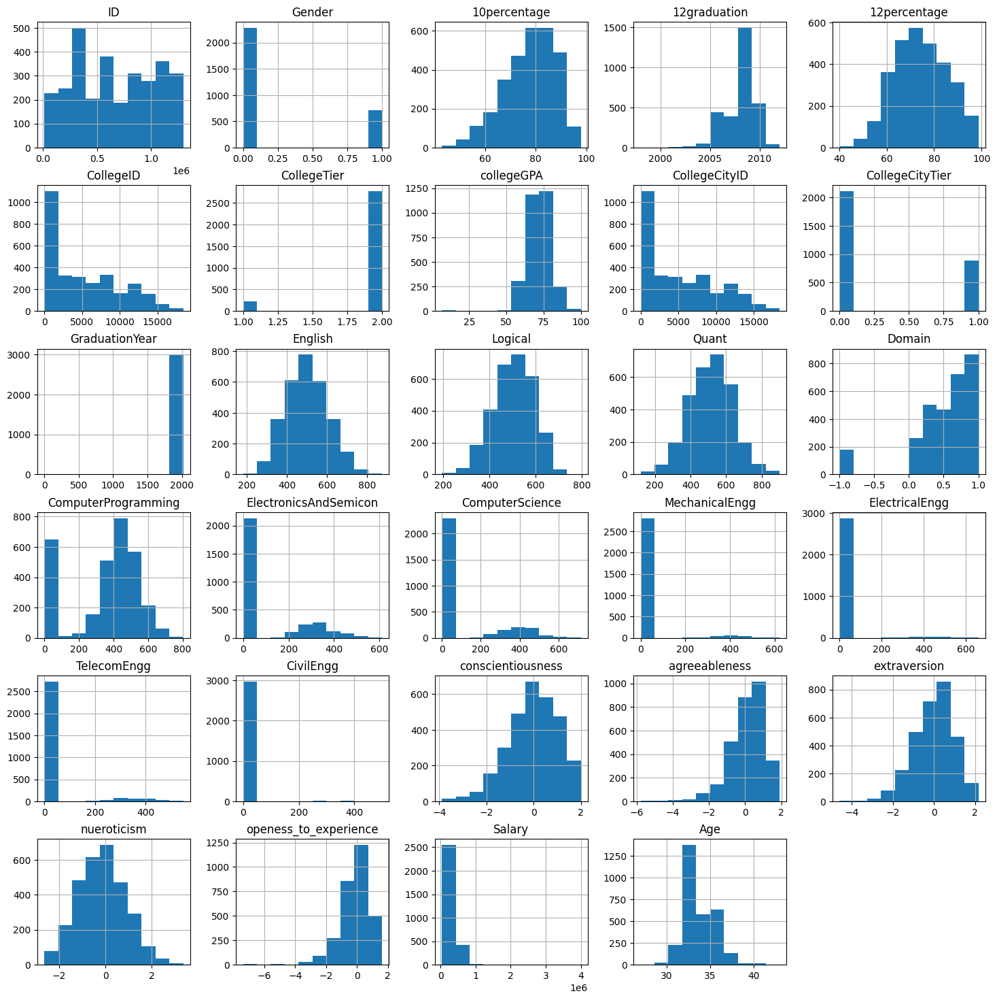

In [9]:
# Histograms for distribution
data.hist(figsize=(18, 18))
plt.show()

### Box plot

Chesk the distribution of salary

<Axes: xlabel='Salary'>

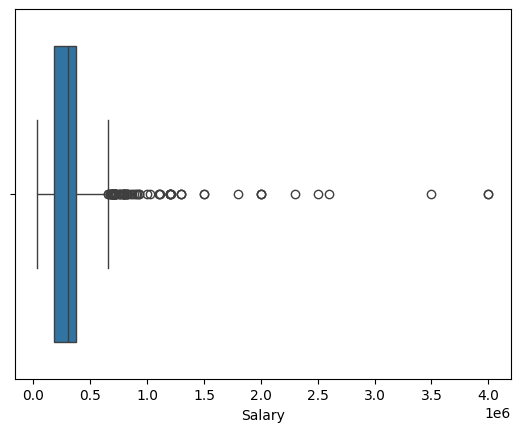

In [28]:
sns.boxplot(x=data.Salary)

### Bar plot

Who(male/female) is earning much salary

<Axes: xlabel='Gender', ylabel='Salary'>

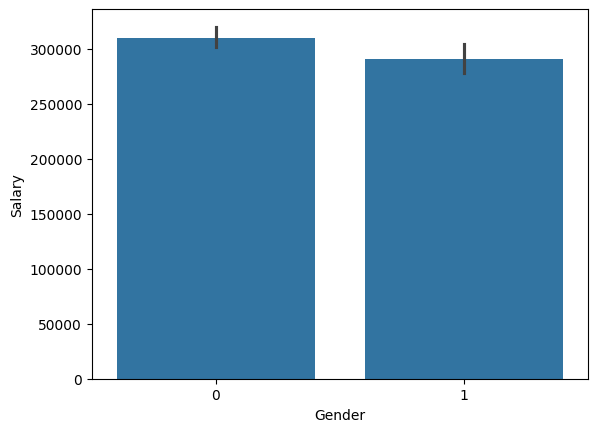

In [10]:
sns.barplot(x='Gender',y='Salary',data=data)

Counting the specialization
---We can see that electronics and communication engineering is most opted specialization

In [11]:
data['Specialization'].value_counts()

Specialization
electronics and communication engineering      670
computer science & engineering                 557
information technology                         506
computer engineering                           415
computer application                           201
mechanical engineering                         155
electronics and electrical engineering         148
electronics & telecommunications                89
electrical engineering                          63
electronics & instrumentation eng               24
instrumentation and control engineering         18
information science engineering                 18
electronics and instrumentation engineering     18
civil engineering                               15
electronics engineering                         13
biotechnology                                   12
other                                           10
industrial & production engineering              8
chemical engineering                             7
applied electron

Which specialization is earning much salary
----we can see that people who opted for computer networking are earning more

<Axes: xlabel='Salary', ylabel='Specialization'>

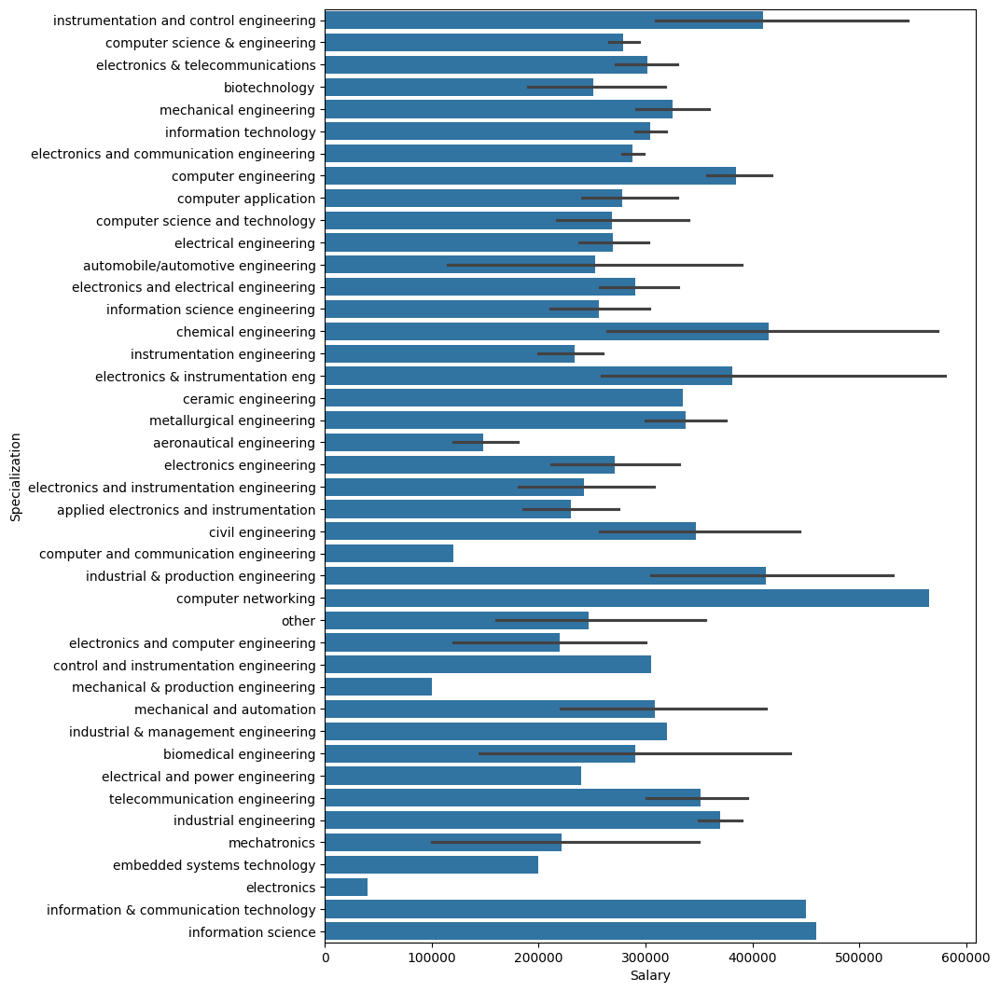

In [12]:
plt.figure(figsize = (9,13))
sns.barplot(y='Specialization',x='Salary',data=data)

For salary and degree
---Salary earned by M.Sc(Tech) is more compared to the other degree

In [13]:
data['Degree'].value_counts()

Degree
B.Tech/B.E.      2757
MCA               200
M.Tech./M.E.       40
M.Sc. (Tech.)       1
Name: count, dtype: int64

<Axes: xlabel='Degree', ylabel='Salary'>

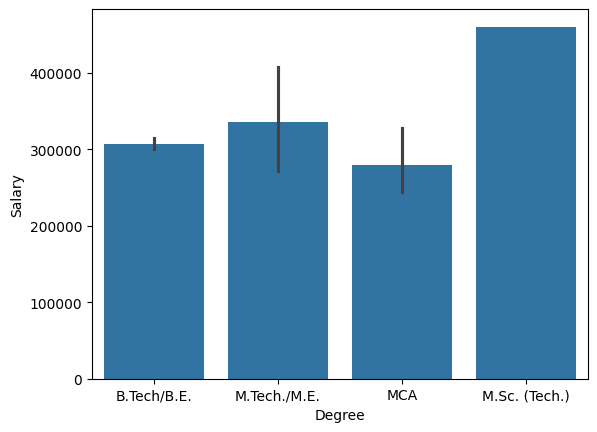

In [14]:
sns.barplot(x='Degree',y='Salary',data=data)

Which graduation year scored highest percentage in 12th
---We can see that 2011 and 2010 scored the highest percentage

<Axes: xlabel='12graduation', ylabel='12percentage'>

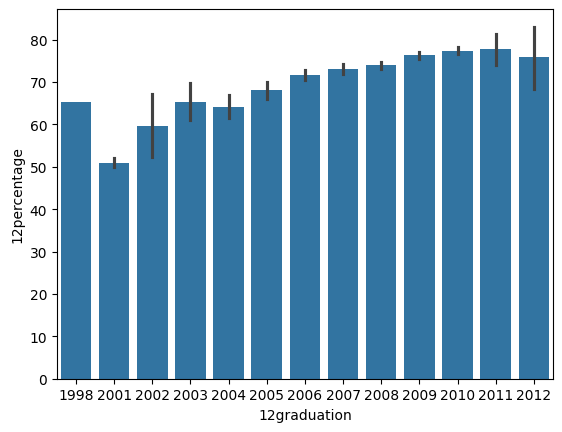

In [15]:
sns.barplot(x = '12graduation', y ='12percentage', data = data)

What is the highest salary for each graduation Year
---In 2010 the highest salary is 350000

<Axes: xlabel='GraduationYear', ylabel='Salary'>

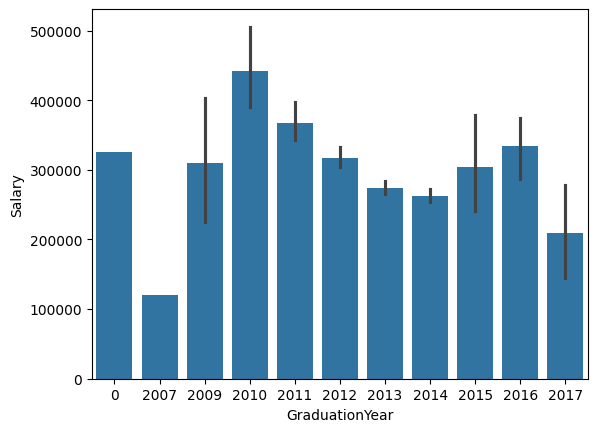

In [16]:
sns.barplot(x = 'GraduationYear', y ='Salary', data = data)

### KDE Plot (Kernel Density Estimate Plot)

/var/folders/2d/fxsd9j2x5c1_4_6qtgkldkmm0000gn/T/ipykernel_8644/1313347962.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['Salary'], shade = True)


<Axes: xlabel='Salary', ylabel='Density'>

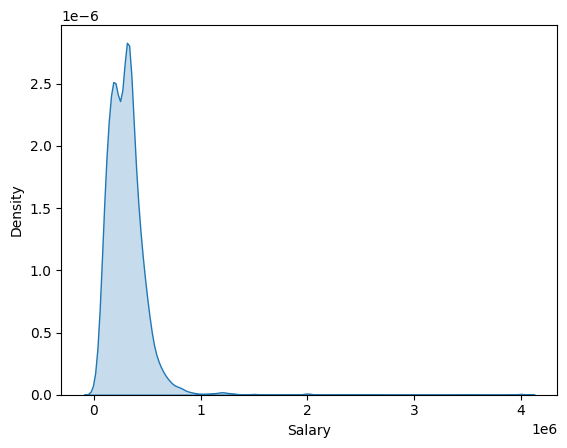

In [17]:
sns.kdeplot(data['Salary'], shade = True)

### Scatter Plot

What is the salary earned based on their 12 board

<Axes: xlabel='12board', ylabel='Salary'>

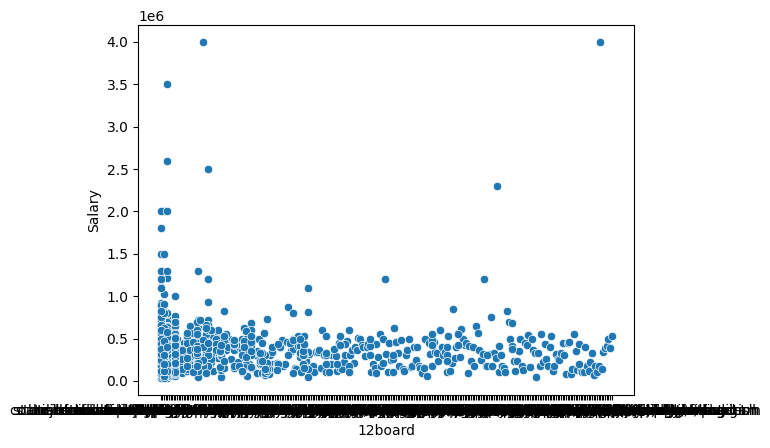

In [18]:
sns.scatterplot(x="12board",y="Salary",data=data)

What is the salary earned based on their 12th percentage

<Axes: xlabel='12percentage', ylabel='Salary'>

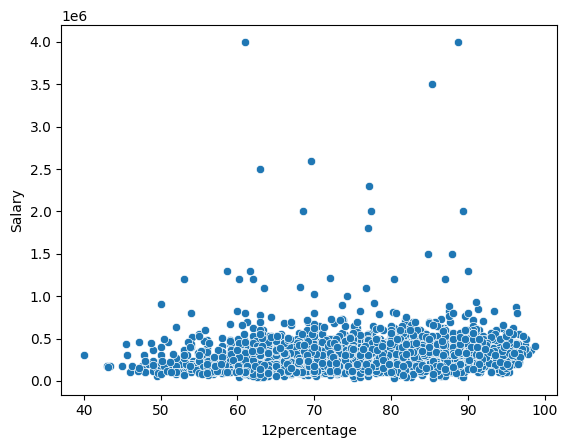

In [19]:
sns.scatterplot(x="12percentage",y="Salary",data=data)

What is the salary earned based on their college GPA

<Axes: xlabel='collegeGPA', ylabel='Salary'>

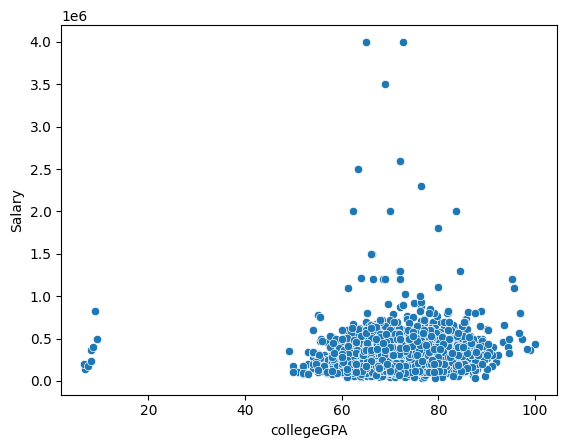

In [20]:
sns.scatterplot(x="collegeGPA",y="Salary",data=data)

### Line Plot

Check the salary distribution for (English socre, Logical score, Quant score, Domain score)

<Axes: xlabel='English', ylabel='Salary'>

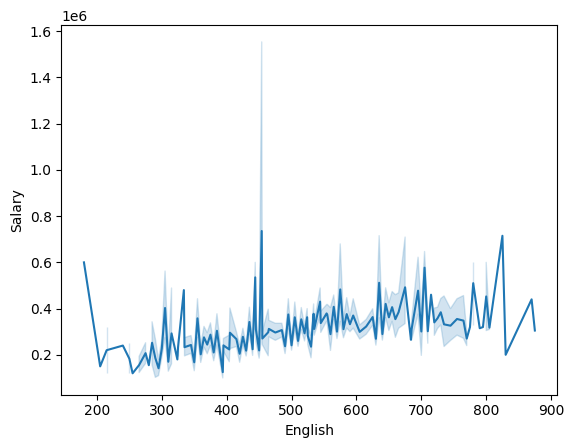

In [21]:
sns.lineplot(x='English', y='Salary', data=data)

<Axes: xlabel='Logical', ylabel='Salary'>

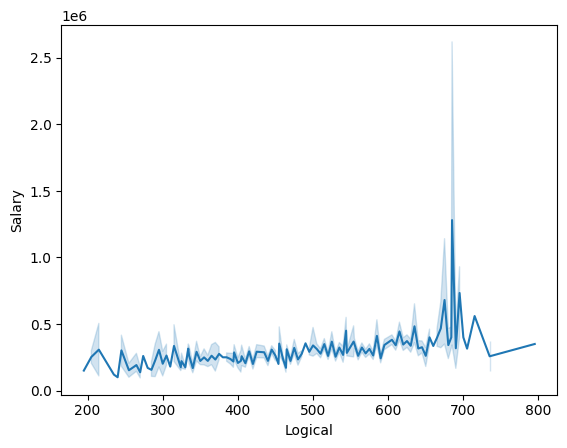

In [22]:
sns.lineplot(x = 'Logical',y = 'Salary', data=data)

<Axes: xlabel='Quant', ylabel='Salary'>

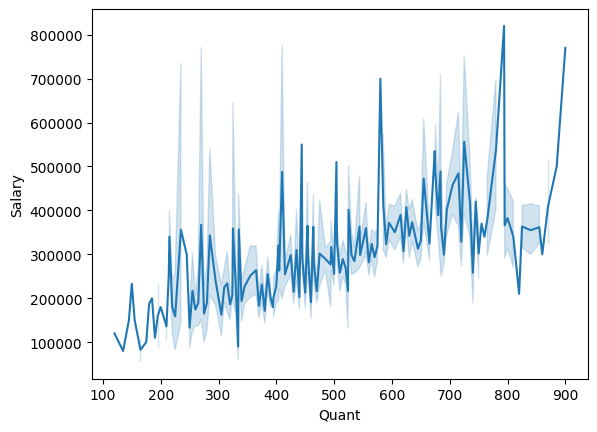

In [23]:
sns.lineplot(x = 'Quant',y = 'Salary', data=data)

<Axes: xlabel='Domain', ylabel='Salary'>

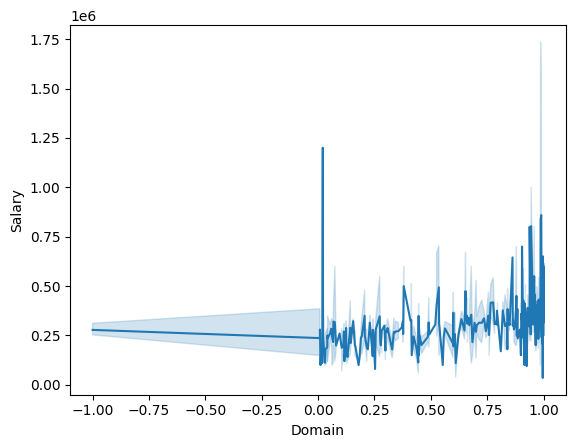

In [24]:
sns.lineplot(x = 'Domain',y = 'Salary', data=data)

### Pair plot

In [25]:
# Pairplot to see pairwise relationships
sns.pairplot(data)
plt.show()

### Correlation plot

Numalize data at first

In [11]:
le = LabelEncoder()
data['10board'] = le.fit_transform(data['10board'])
data['12board'] = le.fit_transform(data['12board'])
data['Degree'] = le.fit_transform(data['Degree'])
data['Specialization'] = le.fit_transform(data['Specialization'])
data['CollegeState'] = le.fit_transform(data['CollegeState'])
data['Degree'] = le.fit_transform(data['Degree'])

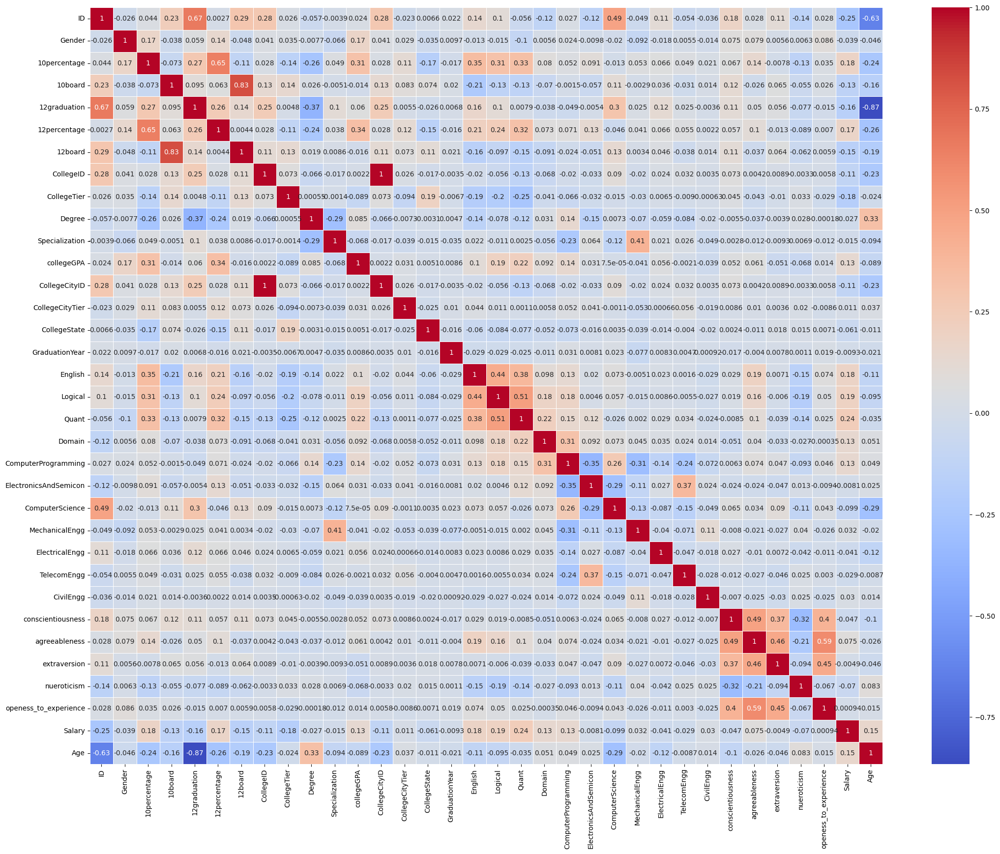

In [12]:
plt.figure(figsize=(26, 20))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.show()

# Machine Learning

### Linear Regression

Mean Squared Error: 15291941098.63927
R2 Score: 0.2570957491916406


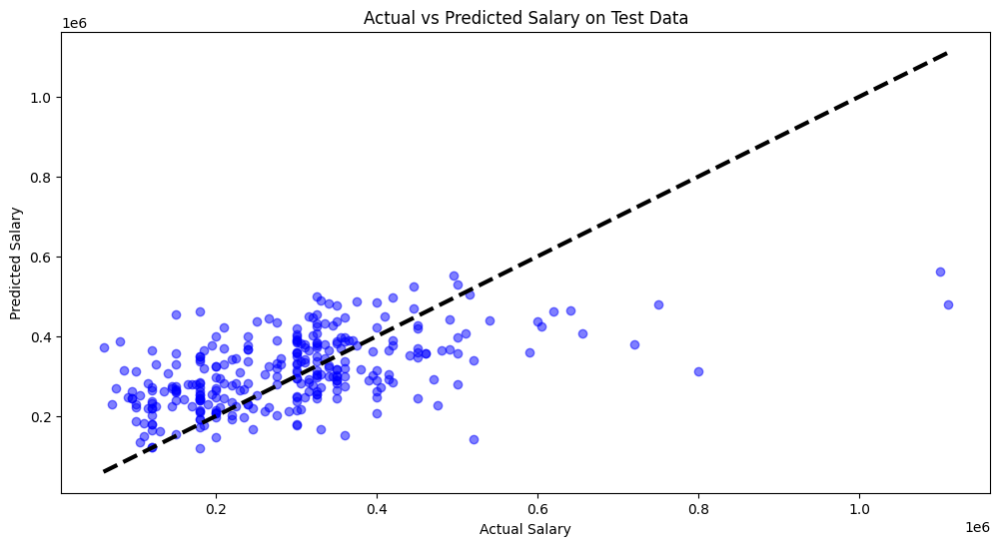

In [52]:

X = data.drop(['Salary','ID'], axis=1)
y = data['Salary']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('R2 Score:', r2_score(y_test, y_pred))
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3)
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('Actual vs Predicted Salary on Test Data')
plt.show()


Mean Squared Error: 16535605515.734932
R2 Score: 0.19667676274121004


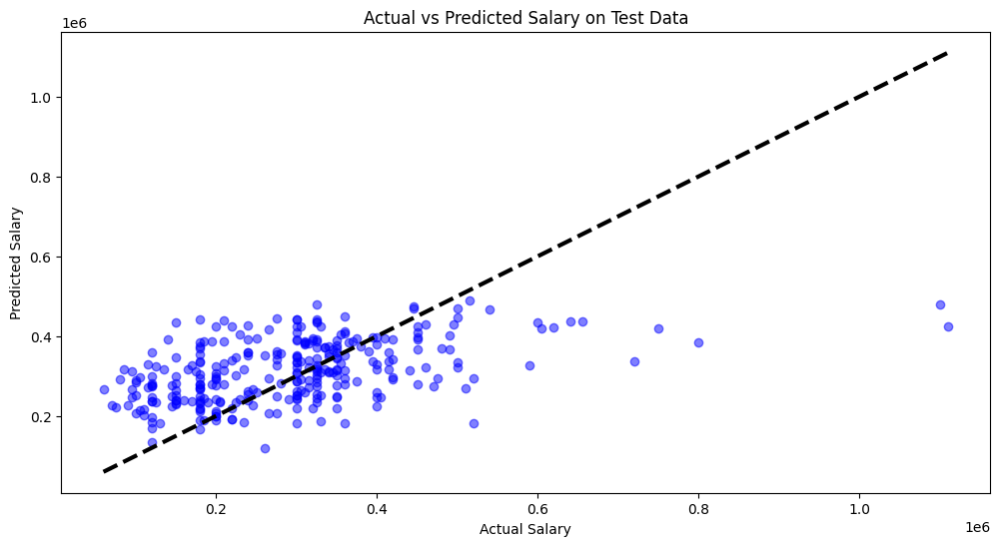

In [53]:
X = data[['Age','ComputerProgramming','Domain',
         'Quant','Logical','English','collegeGPA',
         '12percentage','10percentage']]
y = data['Salary']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('R2 Score:', r2_score(y_test, y_pred))
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3)
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('Actual vs Predicted Salary on Test Data')
plt.show()


### KNN

Mean Squared Error: 21630350781.893005
R2 Score: 0.04832376091619672


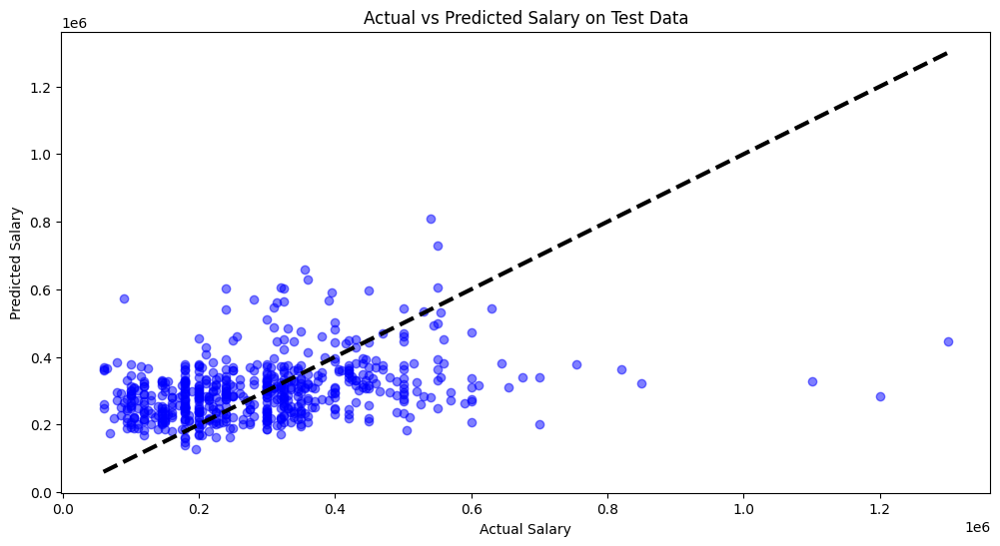

In [38]:
X = data.drop(['Salary', 'ID'], axis=1)
y = data['Salary']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=72)
param_grid = {'n_neighbors': range(1, 10)}
knn = KNeighborsRegressor()
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)
best_n_neighbors = grid_search.best_params_['n_neighbors']
model = KNeighborsRegressor(n_neighbors=best_n_neighbors)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('R2 Score:', r2_score(y_test, y_pred))
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3)
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('Actual vs Predicted Salary on Test Data')
plt.show()

Mean Squared Error: 21775182551.44033
R2 Score: 0.04195155941412798


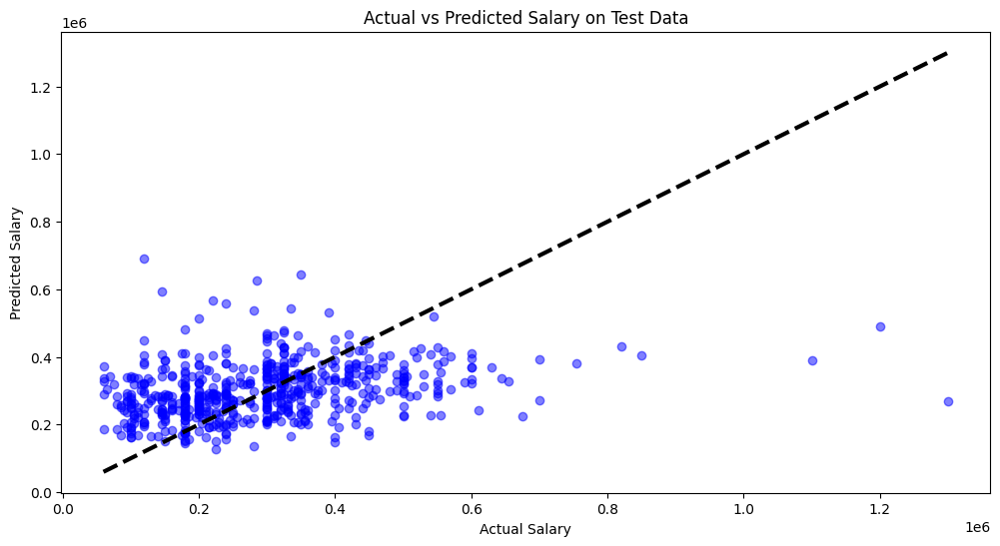

In [39]:
X = data[['Age','ComputerProgramming','Domain',
         'Quant','Logical','English','collegeGPA',
         '12percentage','10percentage']]
y = data['Salary']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=72)
param_grid = {'n_neighbors': range(1, 10)}
knn = KNeighborsRegressor()
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)
best_n_neighbors = grid_search.best_params_['n_neighbors']
model = KNeighborsRegressor(n_neighbors=best_n_neighbors)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('R2 Score:', r2_score(y_test, y_pred))
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3)
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('Actual vs Predicted Salary on Test Data')
plt.show()

### Random Forest

In [ ]:
X = data.drop(['Salary', 'ID'], axis=1)
y = data['Salary']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=72)
model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('R2 Score:', r2_score(y_test, y_pred))
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3)
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('Actual vs Predicted Salary on Test Data')
plt.show()

KeyboardInterrupt: 

KeyboardInterrupt: 

KeyboardInterrupt: 

### XGBoost Regression